# Image classification using Convolutional Neural Networks

##  Introduction

This notebook uses python for image classification using neural networks.

The dataset included for this notebook is the [LHI-Animal-Faces dataset](https://vcla.stat.ucla.edu/people/zhangzhang-si/HiT/exp5.html) from the publication: Z. Si and S.-C. Zhu. Learning hybrid image templates (HIT) by information projection. Pattern Analysis and Machine Intelligence, IEEE Transactions on, 34(7):1354–1367, 2012

## Preliminaries

## The OS lib

In [1]:
import os

file_path = './file.txt'
if os.path.exists(file_path):
    print("File exists")
else:
    print("File does not exist")


File does not exist


In [1]:
import os

dir_path = './new_dir/new_sub_dir'
os.makedirs(dir_path)  # Creates the directory and any necessary parent directories

In [2]:
import os

dir_path = './'
file_list = os.listdir(dir_path)
for file_name in file_list:
    print(file_name)


.DS_Store
~$classification_with_nn.pptx
ml_cv_example.ipynb
Figures
classification_with_nn.pptx
dataLoader.py
Data
helpers.py


In [3]:
import os

path = './new_dir'
if os.path.isfile(path):
    print("Path is a file")
elif os.path.isdir(path):
    print("Path is a directory")
else:
    print("Path does not exist or is neither a file nor a directory")


Path does not exist or is neither a file nor a directory


## The OpenCV lib

OpenCV (Open Source Computer Vision Library) is a widely used open-source library for computer vision and image processing tasks. It provides a collection of tools and algorithms that enable developers to work with images and videos effectively. OpenCV offers various functionalities, including image and video I/O, image transformation, feature detection, object recognition, camera calibration, and more. It supports multiple programming languages, including Python, C++, and Java, making it accessible for different applications and platforms. OpenCV is extensively used in fields such as robotics, augmented reality, surveillance, medical imaging, and machine learning.

Some really basic examples:

In [1]:
import cv2

image_path = './Data/AnimalFaces/BearHead/bearfrontal0001.jpg'
image = cv2.imread(image_path)  # Load the image
cv2.imshow('Image', image)  # Display the image
cv2.waitKey(0)  # Wait for a key press
cv2.destroyAllWindows()  # Close the image window

In [2]:
import cv2

image_path = './Data/AnimalFaces/BearHead/bearfrontal0001.jpg'
image = cv2.imread(image_path)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imshow('Grayscale Image', gray_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [3]:
import cv2
import numpy as np

image = np.zeros((400, 400, 3), dtype=np.uint8)  # Create a black image
cv2.rectangle(image, (50, 50), (200, 150), (0, 255, 0), 2)  # Draw a rectangle
cv2.circle(image, (300, 200), 50, (0, 0, 255), -1)  # Draw a filled circle
cv2.line(image, (200, 50), (200, 150), (255, 0, 0), 3)  # Draw a line
cv2.imshow('Image with Shapes', image)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Image classification

### What is Scikit-learn?
Scikit-learn, also known as sklearn, is a widely used open-source machine learning library in Python. It provides a comprehensive set of tools and algorithms for various machine learning tasks, including classification, regression, clustering, dimensionality reduction, and model selection. Scikit-learn is built on NumPy, SciPy, and matplotlib, making it easy to integrate with other scientific computing libraries. The library offers a consistent and intuitive API for training and evaluating machine learning models, along with utilities for data preprocessing, feature extraction, and model evaluation. Scikit-learn is known for its emphasis on simplicity, efficiency, and scalability, making it suitable for both beginners and experienced practitioners. With its extensive collection of algorithms and tools, scikit-learn has become a popular choice for machine learning tasks across a wide range of domains and applications.

### What is TensorFlow and Keras?
TensorFlow is a popular open-source deep learning framework developed by Google. It provides a comprehensive ecosystem for building and deploying machine learning models, with a primary focus on neural networks. TensorFlow enables developers to define and train complex models using computational graphs, which represent mathematical operations as nodes and data as edges. It offers a high-level API called Keras for quickly prototyping and building deep learning models, along with a lower-level API for more fine-grained control. TensorFlow supports both CPU and GPU acceleration, allowing efficient computation on a variety of hardware. It also provides tools for distributed computing, model serving, and deployment in production environments. TensorFlow has gained widespread adoption due to its flexibility, scalability, and extensive community support. It is widely used in various domains, including computer vision, natural language processing, robotics, and more, for tackling complex machine learning tasks.

### Loading our modules

In [4]:

import os
os.environ['PYTHONHASHSEED'] = '0'

# Scientific and vector computation for python
import numpy as np

# Plotting library
from matplotlib import pyplot
pyplot.rcParams.update({'font.size': 4, 'figure.dpi': 150})

# SVM model
from sklearn import model_selection

# for computing ROC and P-R curves
from sklearn import metrics

# common math things
import math

# Data loader for animal faces
import dataLoader

# some helper functions
import helpers

# opencv bridge
import cv2

# keras
from keras.models import Sequential
from keras import layers
# with tensorflow backend
import tensorflow as tf

# fixing the randomness
# Seed value
# Apparently you may use different seed values at each stage
seed_value= 42
# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)
# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)
# 4. Set the `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value)
# for later versions: 
# tf.compat.v1.set_random_seed(seed_value)

# tells matplotlib to embed plots within the notebook
%matplotlib inline

DEBUG:tensorflow:Falling back to TensorFlow client; we recommended you install the Cloud TPU client directly with pip install cloud-tpu-client.
DEBUG:h5py._conv:Creating converter from 7 to 5
DEBUG:h5py._conv:Creating converter from 5 to 7
DEBUG:h5py._conv:Creating converter from 7 to 5
DEBUG:h5py._conv:Creating converter from 5 to 7
INFO:numexpr.utils:Note: NumExpr detected 10 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.
DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.


## 1 Dataset Preparation
<a id="section1"></a>
For our classification experiments we will use the LHI-Animal-Faces dataset. This dataset consists “around 2200 images for 20 categories animal or human faces.Compared to other benchmarks, LHI-Animal-Faces has several good properties: (1) the animal face categories are similar to each other due to evolutional relationship and shared parts, and it is a challenging task to discern them; (2) the animal face categories exhibit interesting within class variation, which includes (i) rotation and flip transforms, e.g. rotated panda faces and left-or-right oriented pigeon heads; (ii) posture variation, e.g. rabbits with standing ears and relaxed ears; and (iii) sub-types, e.g. male and female lions” [1].

<img src="Figures/animals.png" alt="Animal Faces Dataset" style="width: 400px;"/>


In the first step you split the loaded images and labels into train, test and validation splits. In general, the train split is used to train the classifier. The validation split is used to tune hyperparameters of the classifier. The test set is not touched until you have found your final configuration and only used to test the final model.
Use a split of (train:val:test) of 60:20:20. 

Notes:
* Use `sklearn.model_selection.train_test_split` with `random_state=42`, to make sure we have the chance to get the same results. Note that the random component in NN architectures is the weight initialization which is necessary to give the backpropagation a starting point.
* The test set should be solely used for displaying final results (confusion matrix, images etc.). You should use the validation subset for tuning relevant parameters (model architecture, learning rate etc.)
* After loading the data, the dataset object is stored in the root folder for later access, which is always loaded when available. Please keep that in mind when you have changed something in the dataset struct, i.e., reload the dataset and store the object again.

Let's load the dataset first and display some statistics (as always: displaying stats is brilliant idea.)

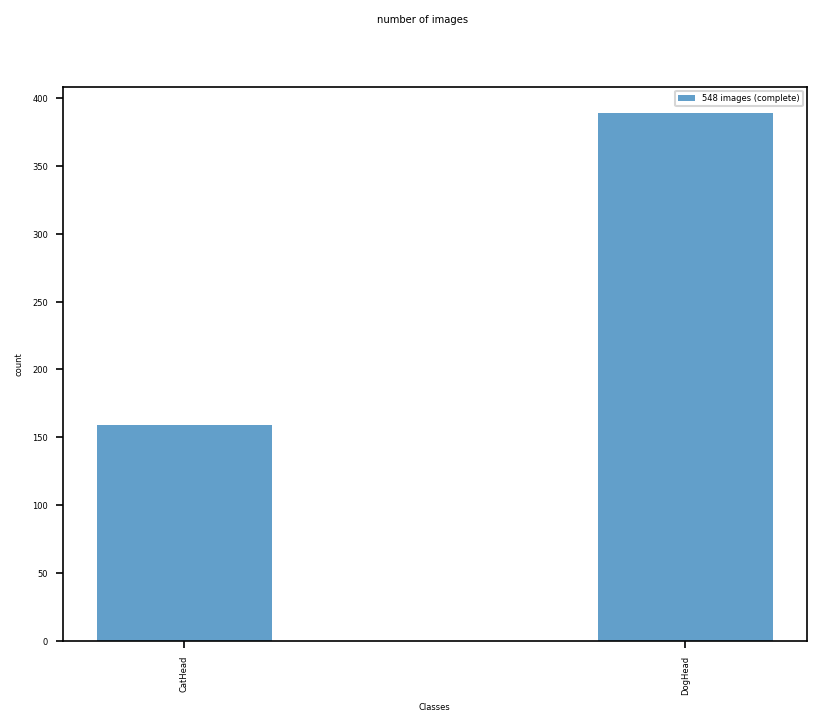

In [3]:
# load dataset
DATALOADER = dataLoader.AnimalFacesDataLoader()

# For the beginning we just use a subset (cat and dog images) of the full training set
X,y = DATALOADER.loadDataset(all=False)
y_names = DATALOADER.get_label_names()

#Show some data statistics
DATALOADER.show_plot_data_statistics()

Display some random sample on the data to get a visual impression (here: only cats/dogs).

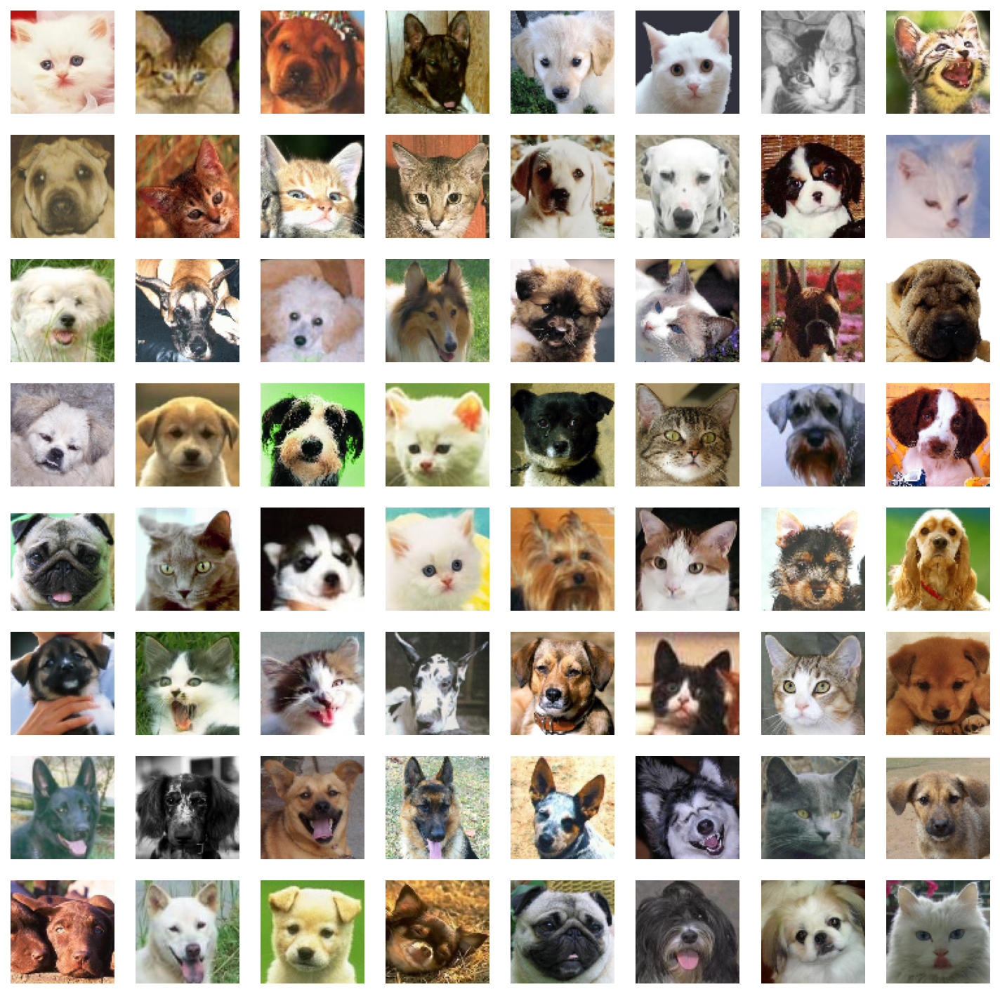

In [4]:
import random
nrow = 8
ncol = 8
_, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12))
axs = axs.flatten()
for img, ax in zip(random.sample(X, nrow*ncol), axs):
    ax.set_axis_off()
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
pyplot.show()

Your task is now to complete the function `createDatasetSplits`.

In [5]:
def createDatasetSplits(X, y, verbose=False):
    """
    Loads the dataset and creates train and validation data splits (data and labels) 
    
    Parameters
    ----------

    X : list
        List of samples where m is number of training examples; here: variable length strings.
    
    y : list
        List of labels for ther training data.
    
    verbose : bool
        If True, print the dataset split stats.

    Returns
    -------
    X_train : array_like
        (o, ) matrix of training samples where o is number of training examples; here: variable length strings.
    X_valid : array_like
        (p, ) matrix of validation samples where p is number of validation examples; here: variable length strings.
    X_test : array_like
        (p, ) matrix of test samples where p is number of test examples; here: variable length strings.
    y_train : array_like
        (o, ) vector of labels for training data.
    y_valid : array_like
        (p, ) vector of labels for validation data.
    y_test : array_like
        (p, ) vector of labels for test data.
    
    Instructions
    ------------
    Use the function train_test_split to split the loaded data into a train and validation set. 
    Use a 60:20:20 (train:val:test) random split of the complete data and use a random_state of 42.
    """

    X_train = []
    X_valid = []
    X_test = []
    y_train = []
    y_valid = []
    y_test = []

    # Splitting loaded data into train,validation and test dataset. 
    # Use a 60:20:20 (train:val:test) random split of the complete data
    # ====================== YOUR CODE HERE ======================
    (X_train, X_valid, y_train, y_valid) = model_selection.train_test_split(X, y, test_size=0.4, random_state=42)
    # half of the test dataset should be validation dataset
    (X_valid, X_test, y_valid, y_test) = model_selection.train_test_split(X_valid, y_valid, test_size=0.5, random_state=42)
    # =============================================================

    if verbose:
        print('----------------')
        print('Datasplits')
        print('Size of X_train: %d; %d percent of complete dataset' % (len(X_train), np.round(len(X_train)/len(X)*100)))
        print('Size of X_valid: %d; %d percent of complete dataset' % (len(X_valid), np.round(len(X_valid)/len(X)*100)))
        print('Size of X_test: %d; %d percent of complete dataset' % (len(X_test), np.round(len(X_test)/len(X)*100)))
        print('Size of y_train: %d; %d percent of complete dataset' % (len(y_train), np.round(len(y_train)/len(X)*100)))
        print('Size of y_valid: %d; %d percent of complete dataset' % (len(y_valid), np.round(len(y_valid)/len(X)*100)))
        print('Size of y_test: %d; %d percent of complete dataset' % (len(y_test), np.round(len(y_test)/len(X)*100)))
        print('----------------')

    return X_train, X_valid, X_test, y_train, y_valid, y_test

Execute the function

In [6]:
# train / validation split
print("Generating data splits ... ")
X_train, X_valid, X_test, y_train, y_valid, y_test = createDatasetSplits(X, y, verbose=1)

Generating data splits ... 
----------------
Datasplits
Size of X_train: 328; 60 percent of complete dataset
Size of X_valid: 110; 20 percent of complete dataset
Size of X_test: 110; 20 percent of complete dataset
Size of y_train: 328; 60 percent of complete dataset
Size of y_valid: 110; 20 percent of complete dataset
Size of y_test: 110; 20 percent of complete dataset
----------------


## 2 Plain Image Feature Extraction
<a id="section2"></a>

Since we expect case we use just the raw intensity values (either color or gray values as you prefer. 
Scale down the input size of the image to 80x80 (width x height) and use the scaled down images as features.

Your task is now to complete the function `extract_features`.
You could make use of the opencv `resize` function for scaling the image. Make sure the input to the resize function is a numpy array.
Make sure your features are represented as `np.float32` values.


In [7]:
def extract_features(X):
        '''
        Input:
            X -- gray or color image depending on feature extraction method
        Output:
            feature_vector_array -- Numpy array of feature representations (also an array): scaled image of size self.INPUT_IMG_WIDTH * self.INPUT_IMG_HEIGHT * color_channels
        '''
        feature_vector_array = []
        for idx, img in enumerate(X):
            if idx > 0 and idx % 1000 == 0:
                print("Processed {}/{}".format(idx, len(X)))
            image = cv2.resize(np.array(img), (32, 32), interpolation = cv2.INTER_AREA)
            feature_vector = np.array(image, dtype=np.float32)
            
            feature_vector_array.append(feature_vector)

        return np.array(feature_vector_array)

You should check the result be executing the below cell. 

In [8]:
# s
print("Creating features from images ... ")
feature_vector_array = extract_features(X)
print("Created %d feature vectors in array feature_vector_array." % len(feature_vector_array))

Creating features from images ... 
Created 548 feature vectors in array feature_vector_array.


Make sure that you have still a valid 32x32 image stored in each feature vector. Check with below code. You should see a 32x32 color image.

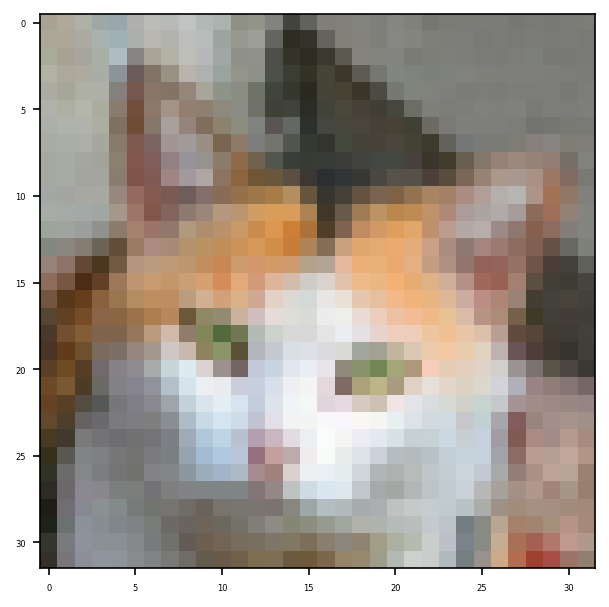

In [9]:
pyplot.imshow(cv2.cvtColor(np.array(feature_vector_array[20], np.uint8), cv2.COLOR_BGR2RGB))

## 3 CNN Training
<a id="section3"></a>
In this step we train a CNN classifier using Keras (a easy-to-use library with Tensorflow backend for training Neural Networks). Instead of relying on a hand-crafted feature representation like HOG (Histogram of Oriented Gradients) we would like to build our features implicitly in the neural network. This is possible because we will use multiple hidden layers which can learn and represent powerful feature representation which can then be classified (again) using a linear classifier. We could also use a SVM here again for the linear classification task. But we can also do the linear classification directly in the neural network by a final dense layer and a Softmax activation function.
For a start I recommend the following layer configuration:
1)	    Input layer with correct image size (80x80x3 for color)
2)	    Convolution with a 3x3 kernel resulting in 64 feature maps; Activation function: Rectified Linear Unit (ReLu)
3)	    2x2 Max Pooling, Stride 2x2
4)      Drop Out Layer, 25% drop out probability
5)	    Convolution with a 3x3 kernel resulting in 128 feature maps; Activation function: Rectified Linear Unit (ReLu)
6)	    2x2 Max Pooling, Stride 2x2
7)      Drop Out Layer, 25% drop out probability
8)	    Flattening layer
9)	    Fully connected layer (Dense) on the flattened vector with 512 neurons as output; Activation function: Rectified Linear Unit (ReLu)
10)     Drop Out Layer, 25% drop out probability
10)	    Fully connected layer (Dense) with num_labels neurons as output; Activation function: Softmax

Note that this model is by definition already a `Deep Neural Network`.
Train this model using the SparseCategoricalCrossentropy loss, which is a variant of the already discussed cross entropy loss working on sparse categorical labels (i.e. integers). As optimizer use the Adam optimizer which controls how the learning rate is adapted during training.
Start training with 50 epochs and a batch_size of 32 images per batch. For each batch one iteration of backpropagation is computed. An epoch contains #samples / #batch_size iterations and the classifier has seen all samples once in one epoch.

Notes: 
* To make training easier it is important to normalize feature values. You can do so by substracting the mean computed across all feature values in training set and dividing by the standard deviation (scaling) across all feature values in training set. Make sure that you save this mean and scaling factor in your resulting classifier object to be able to apply this normalization also in the test case (see classifier dict at the end of the function). 
* You could make use of the following imports: keras.models.Sequential, keras.layers (Conv2D, MaxPooling2D, Flatten, Dense), tf.kersas.losses.SparseCategoricalCrossentropy
* use the verbose flag to see some output of the function


Your task is now to complete the function `cnnTraining`.

In [10]:
def cnnTraining (trainData, trainLabels, valData, valLabels, num_epochs=30, num_batches=32, verbose = 2):
    '''
    Training of classfier

    Input:
        (trainData) -- Training data array
        (trainLabels) -- Training label 1d array
        (valData) -- Validation data array
        (valLabels) -- Validation labels 1d array
        (num_epochs) -- Num epochs to train (after each epoch the training has seen the complete training data
        (num_batches) -- Number of samples in one batch (check slides on Batch Gradient Descent)
        (verbose) -- 0: no debug; 1-2: more debug
    Output:
        Trained classifier dictionary struct containing classifier model, history and normalization parameters.
    '''

    print("Training CNN classifier....")
    # convert list of labels to binary class matrix

    # Rest the rnd generators
    seed_value= 42
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.random.set_seed(seed_value)
    
    classifier = None
    # TODO-5: Prepare features using PlainImageExtraction:batch_extract_features and train a CNN model. You need to specifiy the CNN model 
    # and the hyperparameters (e.g. layers, batch_size, optimizer, loss function, epochs). 
    # Normalize training feature values for easiier training and save normalization paramteres for later application.
    # You might wanna apply the validation dataset directly in the fit function to receive some validation results duriong training after each epoch.

    # TODO-BLOCK-BEGIN
    feature_array_train = np.array(extract_features(trainData),dtype=np.float32)
    feature_array_val = np.array(extract_features(valData),dtype=np.float32)
    labels_train = np.array(trainLabels)
    labels_val = np.array(valLabels)


    # pre-processing: divide by std and substract mean
    mean = np.mean(feature_array_train, axis=0)
    feature_array_train -= mean
    scale = np.std(feature_array_train, axis=0)
    feature_array_train /= scale

    feature_array_val -= mean
    feature_array_val /= scale
    
    num_lables = len(np.unique(labels_train))

    model = Sequential()

    model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(32, 32, 3)))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(0.25))

    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(0.25))

    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dropout(0.25))
    model.add(layers.Dense(num_lables, activation='softmax'))

    model.summary()
    print("Training...")
    model.compile(optimizer='adam',
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy'])
    history = model.fit(feature_array_train, labels_train, validation_data=(feature_array_val, labels_val), epochs=num_epochs, batch_size=num_batches, verbose=verbose)
    classifier = {'model':model, 'history':history, 'scale':scale, 'mean':mean}

    return classifier
    # TODO-BLOCK-END



Now train your classifier.

In [11]:
classifier = cnnTraining(X_train, y_train, X_valid, y_valid, num_epochs=20, num_batches=16, verbose = 2)

Training CNN classifier....
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 15, 15, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 128)        0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)        

2023-05-25 18:23:04.680633: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


21/21 - 1s - loss: 0.7144 - accuracy: 0.6768 - val_loss: 0.5562 - val_accuracy: 0.6455 - 599ms/epoch - 29ms/step
Epoch 2/20
21/21 - 0s - loss: 0.4599 - accuracy: 0.7866 - val_loss: 0.4469 - val_accuracy: 0.7909 - 261ms/epoch - 12ms/step
Epoch 3/20
21/21 - 0s - loss: 0.3731 - accuracy: 0.8171 - val_loss: 0.3891 - val_accuracy: 0.8182 - 249ms/epoch - 12ms/step
Epoch 4/20
21/21 - 0s - loss: 0.3137 - accuracy: 0.8476 - val_loss: 0.3906 - val_accuracy: 0.7909 - 234ms/epoch - 11ms/step
Epoch 5/20
21/21 - 0s - loss: 0.2734 - accuracy: 0.9024 - val_loss: 0.3330 - val_accuracy: 0.8818 - 233ms/epoch - 11ms/step
Epoch 6/20
21/21 - 0s - loss: 0.2034 - accuracy: 0.9177 - val_loss: 0.3239 - val_accuracy: 0.8727 - 238ms/epoch - 11ms/step
Epoch 7/20
21/21 - 0s - loss: 0.1431 - accuracy: 0.9421 - val_loss: 0.3714 - val_accuracy: 0.8273 - 254ms/epoch - 12ms/step
Epoch 8/20
21/21 - 0s - loss: 0.0771 - accuracy: 0.9787 - val_loss: 0.2861 - val_accuracy: 0.8636 - 234ms/epoch - 11ms/step
Epoch 9/20
21/21 - 

Not that the object 'classifer' contains your model, the history, and the normalization parameters which are also needed later for test. Let's use the stored history to plot the training and validation accuracy to see how things have evolved. Executing the below cell should show somehting similar to this plot.

<img src="Figures/acc_catsdogs.png" alt="Accuracy Dogs Cats" style="width: 400px;"/>

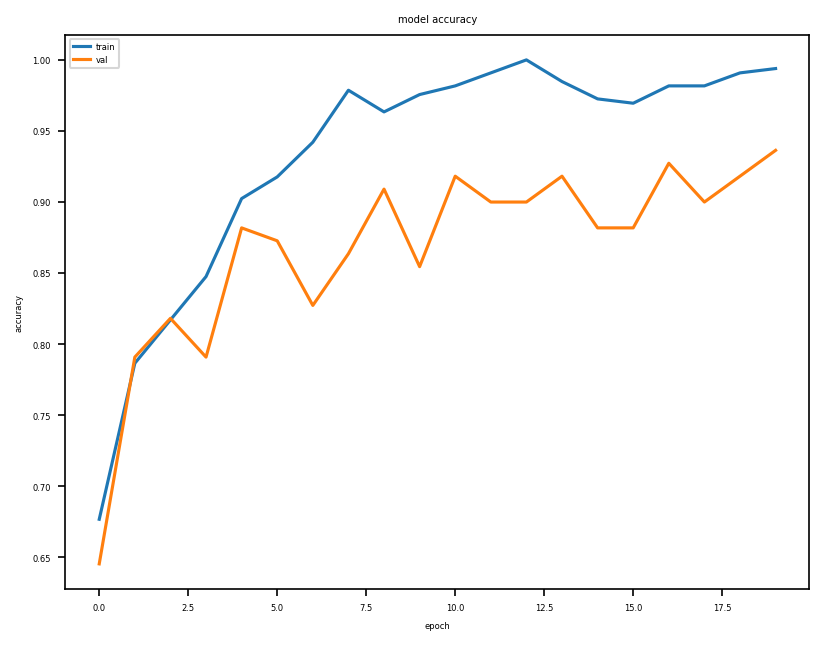

In [12]:
#lets plot the validation and train accuracy over the epochs
pyplot.plot(classifier['history'].history['accuracy'])
pyplot.plot(classifier['history'].history['val_accuracy'])
pyplot.title('model accuracy')
pyplot.ylabel('accuracy')
pyplot.xlabel('epoch')
pyplot.legend(['train', 'val'], loc='upper left')
pyplot.show()

## 4 CNN Test
<a id="section4"></a>
Next we will use our model to predict the class of some unseen images (i.e. our test images). 
Your task is now to complete the function `cnnTest`. 

Notes:
* Make sure you handle the data exactly in the same way as you have done it for training, i.e., the features used in cnnTest need to use the same pre-processing pipeline as used for training. Furthermore, don't forget to normalize the feature values as also done in training (substract mean and divide by std deviation using the values in the classifier object).

In [13]:
def cnnTest(classifier, X):
    '''
    Classification of feature samples

    Input:
        (classifier) -- classifier object ({'model':model, 'history':history, 'scale':scale, 'mean':mean})
        (X) -- data samples (single or list) for classification
    Output:
        predictions for each feature sample: 
        either probabilites resulting in a 2d array of size (#samples, #classes)
    '''
    prediction = []

    feature_vector = np.array(extract_features(X), dtype=np.float32)
    if classifier:
        feature_vector -= classifier['mean']
        feature_vector /= classifier['scale']
        prediction = classifier['model'].predict(feature_vector)
    # print(prediction)
    return prediction   


Let's use your prediction function now

In [14]:
pred_test = cnnTest(classifier, X_test)
print("Classification accuracy on test set: %0.4f" % helpers.get_classification_accuracy(y_test, pred_test))

4/4 [==============================] - 0s 5ms/step
Classification accuracy on test set: 92.7273


Next, visualize the results (qualitative evaluation). 
You should see an array of images with red and green borders. Green are correctly classified samples and read are incorrectly classified samples respectively.

In [15]:
def show_classified_samples(images, preds, labels):
    max_pred = np.argmax(preds, axis=-1)
    matches = [1 if i==j else 0 for i, j in zip(max_pred,labels)]
    nrow = 8
    ncol = 8
    _, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12))
    axs = axs.flatten()
    for img, correct, ax in zip(random.sample(images, nrow*ncol), matches, axs):
        img_sample_copy = np.array(img).copy()
        if(not correct):
            color = (0,0,255)
        else:
            color = (0,255,0)
        cv2.rectangle(img_sample_copy, (0, 0), (img_sample_copy.shape[0], img_sample_copy.shape[1]), color, 4)
        # you could also decide to visualize the probability with a text object on each image sample
        # cv2.putText(img_sample_copy, "%0.2f" % pred_val, text_origin, font, 
        #                fontScale, color, thickness, cv2.LINE_AA)
        ax.set_axis_off()
        ax.imshow(cv2.cvtColor(img_sample_copy, cv2.COLOR_BGR2RGB))

    pyplot.show()


Executing `show_classified_samples` should give you a plot similar to this one.

<img src="Figures/qual_catsdogs.png" alt="Accuracy Dogs Cats" style="width: 400px;"/>

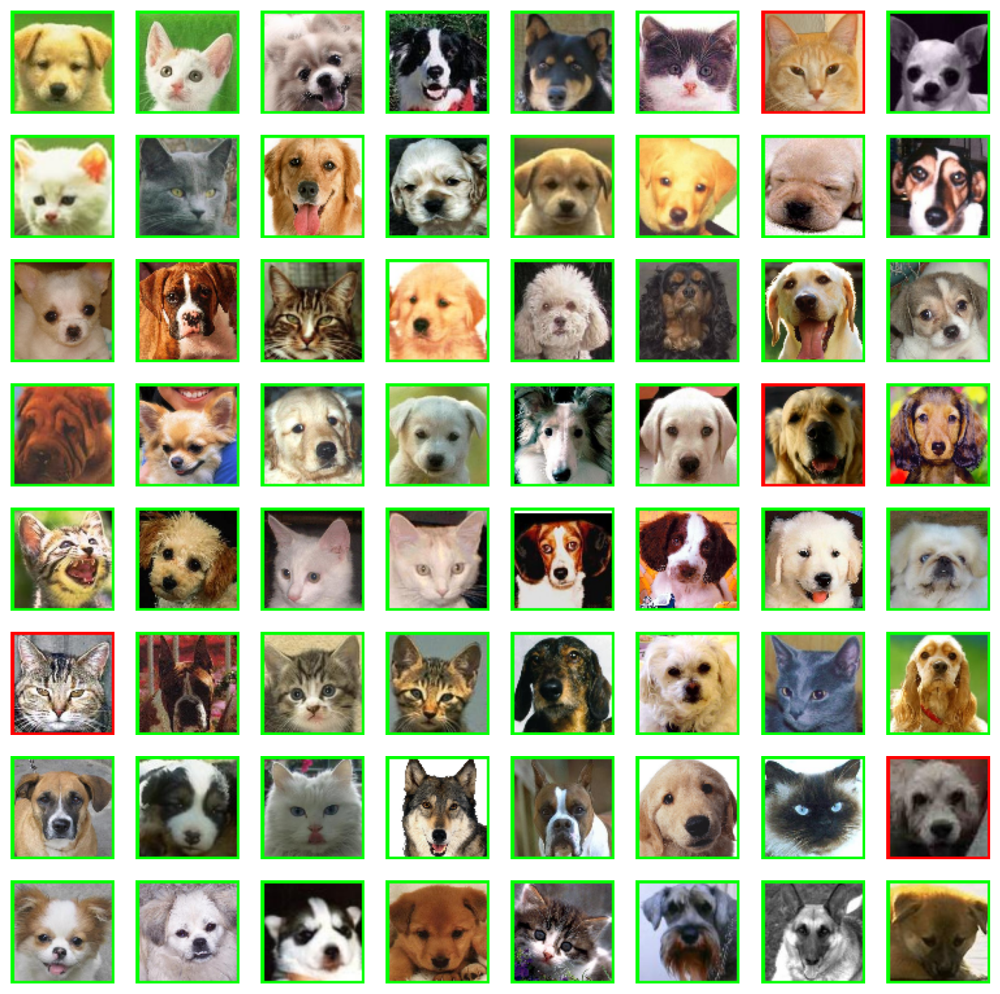

In [16]:
show_classified_samples(X_test, pred_test, y_test)

## 5 Confusion Matrix (Cats vs. Dogs)
<a id="section5"></a>
A confusion matrix C is such that $C_(i,j)$ is equal to the number of observations known to be in group i and predicted to be in group j. Therefore, a confusion matrix allows to see the inter-class confusion. On the diagonal you see the number of correctly predicted samples, and on the other off-diagonal elements you can read what class was instead predicted. This allows some good insights in classification errors and also identify possible steps for improvement. 

Your task is now to complete the function `compute_confusion_matrix_plot`. 

Notes:
* Here you need to call the correct function from `sklearn.metrics` to compute the confusion matrix and use the result of `compute_confusion_matrix_plot` in `helpers.plot_confusion_matrix` which performs a nice plot of the confusion matrix. Alternatively for sure you can compute the confusion matrix also on your own.
* Normalize the confusion matrix.

In [17]:
def compute_confusion_matrix_plot(predictions, labels):
    '''
    Shows confusion matrix
    Input:
        predictions
        labels
    '''
    assert(len(labels)==len(predictions))

    # in case we have (#smaple x #classes) we have a probability prediction, 
    # so we need to find the label with max probability
    if predictions.ndim==2:
        pred_max = np.argmax(predictions, axis=-1)
    else:
        pred_max = predictions

    confMatrix = np.zeros((2,2))
    
    confMatrix = metrics.confusion_matrix(labels, pred_max, normalize="true")

    # return confusion matrix
    return confMatrix

Your confusion matrix should look for the two-class case similar to this one.

<img src="Figures/conf_catsdogs.png" alt="Accuracy Dogs Cats" style="width: 400px;"/>


Normalized confusion matrix
[[0.88235294 0.11764706]
 [0.05263158 0.94736842]]


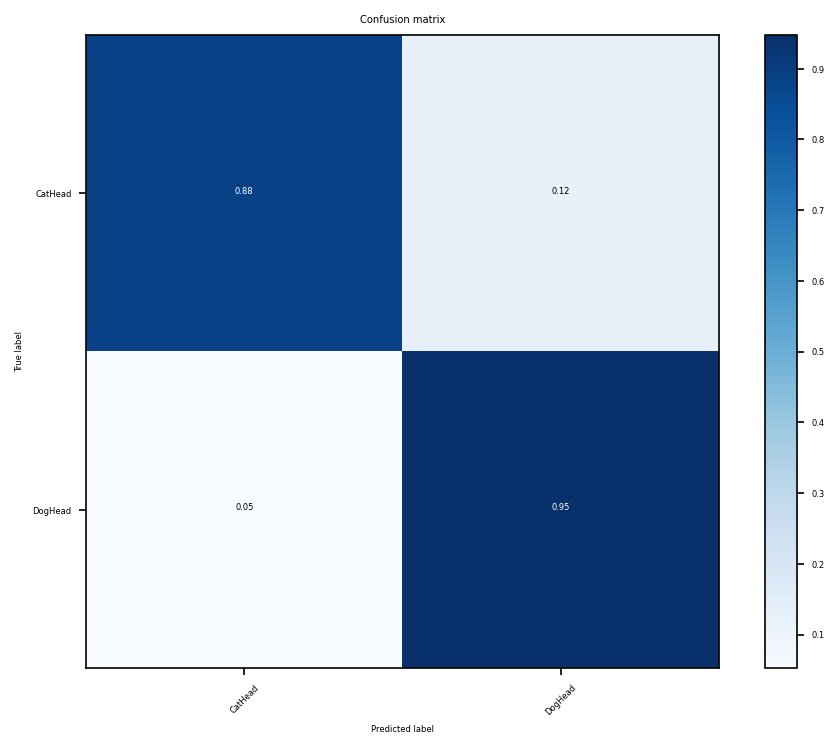

In [18]:
cm = compute_confusion_matrix_plot(pred_test, y_test)
# Plot normalized confusion matrix
helpers.plot_confusion_matrix(cm, DATALOADER.get_label_names())


# 6 CNN classifier train (All animals)
<a id="section6"></a>

We will no extend our dataset to the full set of [LHI-Animal-Faces dataset](https://archive.ics.uci.edu/ml/datasets/SMS+Spam+Collection) (21 classess). This results in a classification problem which is much harder then the previous 2-class problem. Anyway, if correctly implemented, you should be able to use your previous functions to train and test your classifier for the extended dataset as well.

Let's load the full data

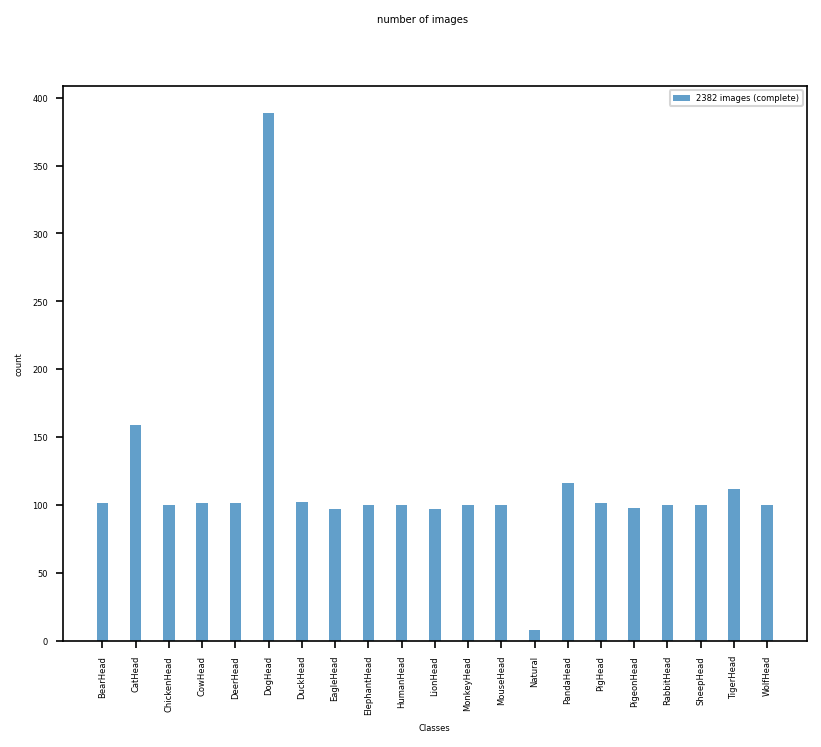

In [19]:
# load dataset
DATALOADER = dataLoader.AnimalFacesDataLoader()

# For the beginning we just use a subset (cat and dog images) of the full training set
X_all,y_all = DATALOADER.loadDataset(all=True)
y_all_names = DATALOADER.get_label_names()

#Show some data statistics
DATALOADER.show_plot_data_statistics()

Let's view some samples...

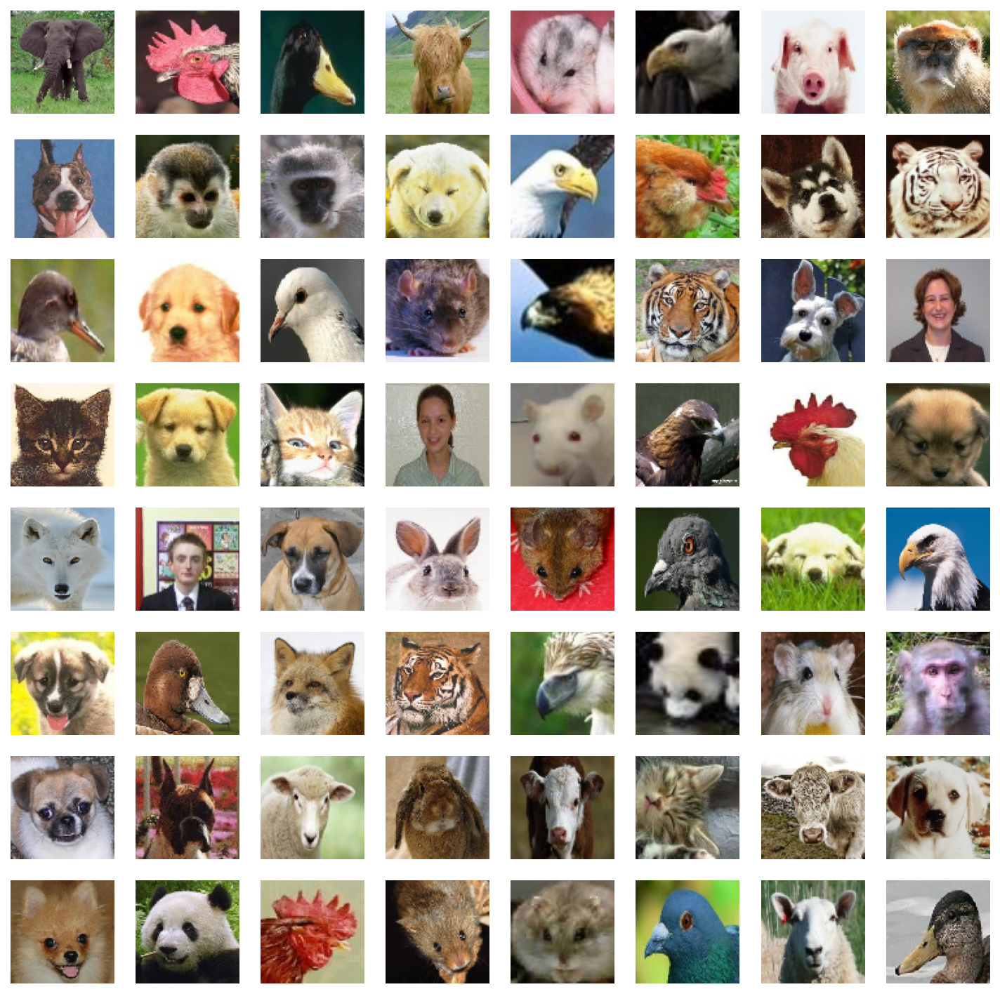

In [20]:
import random
nrow = 8
ncol = 8
_, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12))
axs = axs.flatten()
for img, ax in zip(random.sample(X_all, nrow*ncol), axs):
    ax.set_axis_off()
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
pyplot.show()

Your task is now to call the previously implemented functions correctly to train a model on the full set. You should receive a classification performance on the test set of above 70%. Please note that while we achieved around 95% for the 2-class problem, the 70% accuracy is now the one computed over all 21 classes.

In [21]:
# Perform all steps to train a classifier model on training data and then test it on the test data
# Please use again a 60:20:20 share for train:valid:test data split
pred_all_test = [] #this variable should get your predictions on the test set (all animals).

print("Generating data splits ... ")
X_all_train, X_all_valid, X_all_test, y_all_train, y_all_valid, y_all_test = createDatasetSplits(X_all, y_all, verbose=1)
classifier = cnnTraining(X_all_train, y_all_train, X_all_valid, y_all_valid)
pred_all_test = cnnTest(classifier, X_all_test)

print("Classification accuracy on test set: %0.4f" % helpers.get_classification_accuracy(y_all_test, pred_all_test))


Generating data splits ... 
----------------
Datasplits
Size of X_train: 1429; 60 percent of complete dataset
Size of X_valid: 476; 20 percent of complete dataset
Size of X_test: 477; 20 percent of complete dataset
Size of y_train: 1429; 60 percent of complete dataset
Size of y_valid: 476; 20 percent of complete dataset
Size of y_test: 477; 20 percent of complete dataset
----------------
Training CNN classifier....
Processed 1000/1429
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 30, 30, 64)        1792      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 15, 15, 64)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 15, 15, 64)        0         
           

Use our above function `show_classified_samples` to qualitatively inspect our results.

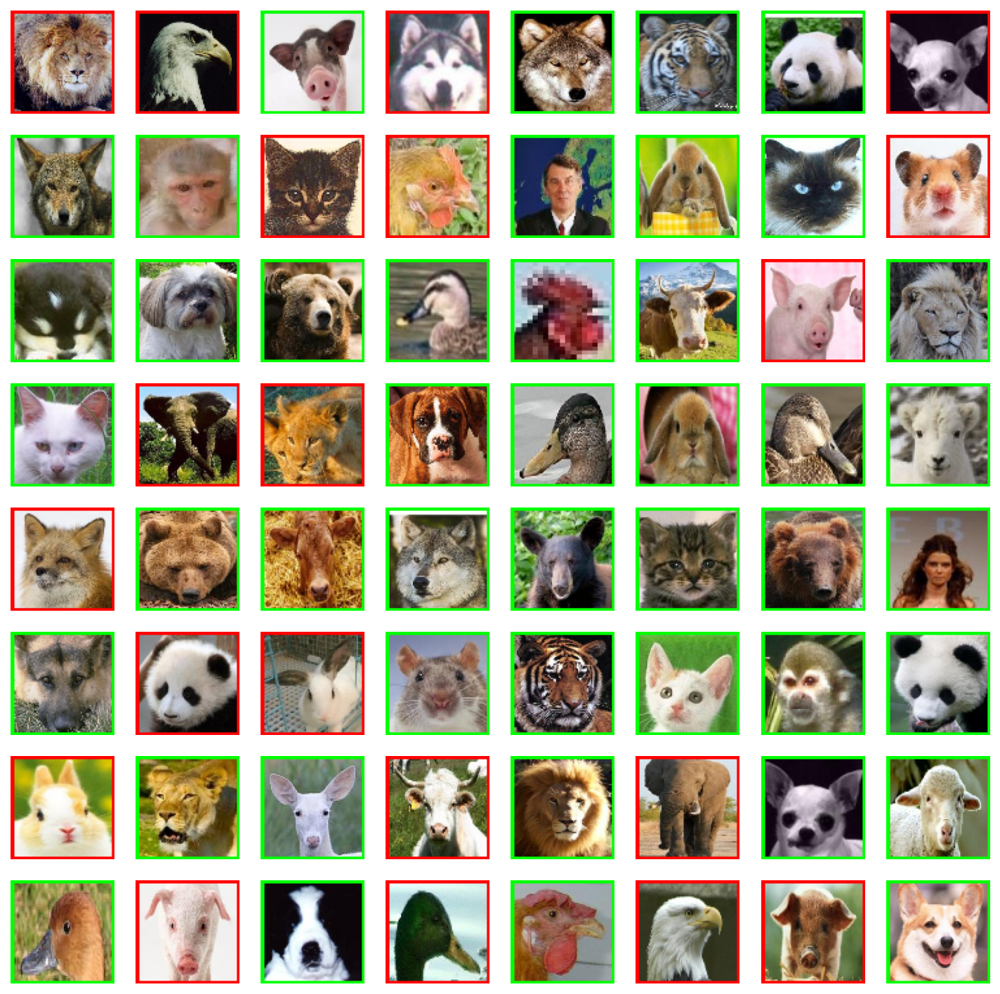

In [22]:
show_classified_samples(X_all_test, pred_all_test, y_all_test)

Quantitative evaluation using confusion matrix.

/Users/fflohr/code/cv-exercises-ss2023/Exercise_3/helpers.py:71: RuntimeWarning: invalid value encountered in divide
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


Normalized confusion matrix
[[0.59090909 0.         0.         0.         0.04545455 0.09090909
  0.         0.         0.04545455 0.         0.         0.
  0.         0.         0.04545455 0.18181818 0.         0.
  0.         0.         0.        ]
 [0.         0.70588235 0.         0.         0.05882353 0.05882353
  0.         0.         0.         0.         0.         0.
  0.05882353 0.         0.         0.02941176 0.         0.05882353
  0.         0.         0.02941176]
 [0.         0.         0.84       0.         0.         0.08
  0.         0.         0.         0.         0.         0.
  0.         0.04       0.         0.04       0.         0.
  0.         0.         0.        ]
 [0.04166667 0.         0.         0.5        0.         0.
  0.         0.         0.04166667 0.         0.08333333 0.
  0.04166667 0.         0.         0.08333333 0.         0.
  0.20833333 0.         0.        ]
 [0.         0.         0.         0.         0.84615385 0.
  0.         0.       

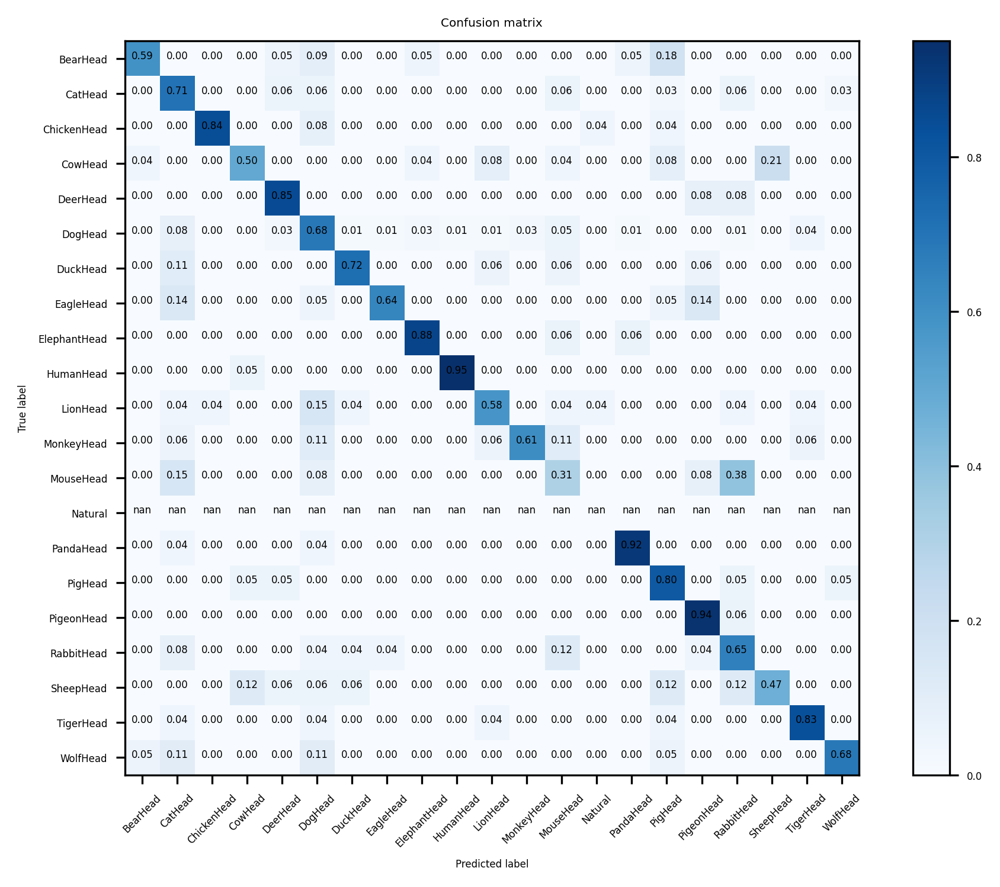

In [23]:
pyplot.rcParams.update({'font.size': 4, 'figure.dpi': 300})
cm = compute_confusion_matrix_plot(pred_all_test, y_all_test)
# Plot normalized confusion matrix
helpers.plot_confusion_matrix(cm, DATALOADER.get_label_names())

### Some additional inspections (optional, but might be needed to win a prize)
The provided dataset is not an easy one, especially when working with all classes. To be able to understand the difficulties better, try to answer the following questions.
* What is the weakest performing class? 
* What is the reason for that? 
* How can you improve the accuracy for this class? Is this easily possible?

## 7 Optimization: Dataset extensions, Data Augmentation, Model adaptions (PRIZE!!)
<a id="section7"></a>

In this section I am offering a prize for the student with the best performing model on the LH Animal Faces Dataset.
You are allowed to do everything, as long as you are not touching the test set (also not for parameter tuning!).
Some ideas are provided in the following.

### Model adaptions
The first you may thing of are model adaptions. The model architecture I provided is not perfect for this dataset. You could have some experiments on alternative model architectures (e.g. chagning the feature map sizes, adding more layers, adding other layer types). Beware of overfitting!

### Using deep model architecture
Using Keras it is quite easy to include one of the well established and pretrained base networks for image classification: https://www.tensorflow.org/api_docs/python/tf/keras/applications
Explore how to use these powerful pretrained network weights and finetune it on the given dataset. For the bigger networks you need a GPU to train them. The model needs to fit on GPU memory otherwise you get an Out-of-mem error. A GPU with at least 8Gb works for the small-medium models.

### Dataset extensions
In most cases a better way is to approach weak performance from the data side (supposing your model is not entirely wrong). Having a detailed inspection on the dataset will allow you to find out some problems with various classes.
Furthermore you could also just extend each class with new samples, e.g. by using Google Image Search.

### Data augmentation 
Often and especially for CNNs, simple data augmentations lead to a boost in performance.
Instead of using each data sample in training only once you could jitter the sample in various directions and produce additional samples used in training. One option to do that is to cutout shifted regions from the original samples of about e.g. 15% of original image size. You could start with shifting the cutouts left/right, top/down and even extend the data augmentation by a slight rotation of the samples. I provided the function `augment_samples` below which you can use as starting point. Be aware that increasing your train size by some magnitudes will slow down the training process (i.e. the time needed to process the data once - epoch).


In [24]:
def augment_samples(data, labels):
        '''
        Jitter image data and extends labels with corresponding classes
        Input:
           data -- images to jitter
           labels -- array of corresponding labels
        Output:
            augmented_data -- original images + additional generated, jittered images
            augmented_labels -- original labels + labels corresponding to each jitterd image (copy of original label)
        '''
        augmented_data = data.copy()
        augmented_labels = labels.copy()
        # TODO-6: Augment training samples by adding samples based on "jittering" original sample.
        # One option to do that is to cutout shifted regions from the original samples of 
        # about e.g. 15% of original image size. You could start with shifting the cutouts left/right, 
        # top/down and even extend the data augmentation by a slight rotation of the samples.
        # TODO-BLOCK-BEGIN
        def jitterSample(im, jitter_fraction = 0.15):
            '''
            Jitter one image sample in 8 directions + center
            Input:
            im -- image to jitter
            jitter_fraction -- fraction of height/width substracted from original sample size and shift fraction
            '''
            jittered_samples = []
            h, w, c = im.shape
            x0 = 0
            y0 = 0
            x1 = w-1
            y1 = h-1

            jitter_width = math.floor(jitter_fraction*w/2.)
            jitter_height = math.floor(jitter_fraction*h/2.)
            x0_init = x0 + jitter_width
            y0_init = y0 + jitter_height
            x1_init = x1 - jitter_width
            y1_init = y1 - jitter_height

            for m in range(-1,2):
                for n in range(-1,2):
                    x0_n = x0_init + n*jitter_width
                    y0_n = y0_init + m*jitter_height
                    x1_n = x1_init + n*jitter_width
                    y1_n = y1_init + m*jitter_height
                    #logging.info("{}-{}-{}-{}".format(y0_n,y1_n, x0_n,x1_n))
                    cutout = im[y0_n:y1_n, x0_n:x1_n]
                    jittered_samples.append(cutout)
                    #cv2.imshow("cutout", cutout)
                    #cv2.waitKey(0)
            #logging.info("Got {} jittered samples.".format(len(jittered_samples)))
            return jittered_samples

        
        for idx, sample in enumerate(data):
            jittered = jitterSample(sample)
            augmented_data.extend(jittered)
            augmented_labels.extend(np.ones(len(jittered), dtype=np.int8)*labels[idx])
         # TODO-BLOCK-END
        return augmented_data, augmented_labels

Compute the prediction values on the test set with the opimized pipeline and submit your prediction results:

In [25]:
# Perform all steps to train a classifier model on training data and then test it on the test data
# Please use again a 60:20:20 share for train:valid:test data split
# Do what ever you want to optimize your results; 
# 
# CODE OF HONOR!:
# Don't touch the test set! 
# That means also in caser you decide to extend the dataset with new samples, 
# Please make sure that you keep the original test data size and samples to have a fair comparison.
pred_all_test_opimized = [] #th bis variable should get your predictions on the test set.

print("Generating data splits ... ")
X_all_train, X_all_valid, X_all_test, y_all_train, y_all_valid, y_all_test = createDatasetSplits(X_all, y_all, verbose=1)
X_all_train, y_all_train = augment_samples(X_all_train, y_all_train)
classifier = cnnTraining(X_all_train, y_all_train, X_all_valid, y_all_valid)
pred_all_test_opimized = cnnTest(classifier, X_all_test)

print("Classification accuracy on test set: %0.4f" % helpers.get_classification_accuracy(y_all_test, pred_all_test_opimized))


Generating data splits ... 
----------------
Datasplits
Size of X_train: 1429; 60 percent of complete dataset
Size of X_valid: 476; 20 percent of complete dataset
Size of X_test: 477; 20 percent of complete dataset
Size of y_train: 1429; 60 percent of complete dataset
Size of y_valid: 476; 20 percent of complete dataset
Size of y_test: 477; 20 percent of complete dataset
----------------
Training CNN classifier....
Processed 1000/14290
Processed 2000/14290
Processed 3000/14290
Processed 4000/14290
Processed 5000/14290
Processed 6000/14290
Processed 7000/14290
Processed 8000/14290
Processed 9000/14290
Processed 10000/14290
Processed 11000/14290
Processed 12000/14290
Processed 13000/14290
Processed 14000/14290
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 30, 30, 64)        1792      
                                                              

/Users/fflohr/code/cv-exercises-ss2023/Exercise_3/helpers.py:71: RuntimeWarning: invalid value encountered in divide
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


Normalized confusion matrix
[[0.63636364 0.         0.         0.09090909 0.         0.04545455
  0.         0.         0.         0.         0.04545455 0.13636364
  0.         0.         0.         0.         0.         0.
  0.         0.         0.04545455]
 [0.02941176 0.70588235 0.         0.02941176 0.         0.05882353
  0.         0.         0.         0.         0.02941176 0.
  0.         0.         0.         0.         0.         0.05882353
  0.05882353 0.         0.02941176]
 [0.         0.         0.92       0.         0.         0.
  0.         0.         0.         0.04       0.         0.
  0.04       0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.5        0.04166667 0.
  0.         0.         0.04166667 0.         0.04166667 0.
  0.         0.         0.         0.04166667 0.         0.
  0.29166667 0.04166667 0.        ]
 [0.         0.         0.         0.         0.84615385 0.
  0.         0. 

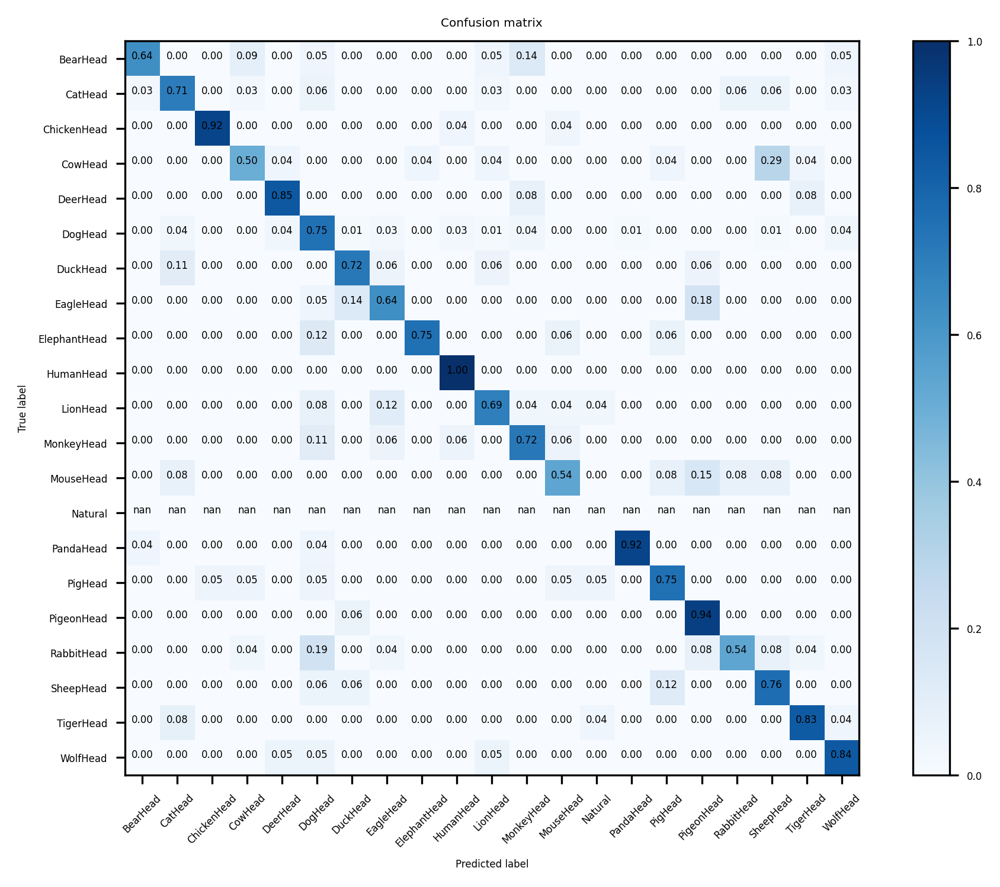

In [26]:
pyplot.rcParams.update({'font.size': 4, 'figure.dpi': 300})
cm = compute_confusion_matrix_plot(pred_all_test_opimized, y_all_test)
# Plot normalized confusion matrix
helpers.plot_confusion_matrix(cm, DATALOADER.get_label_names())